### The goals / steps of this project are the following:

1. Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
2. Apply a distortion correction to raw images.
3. Use color transforms, gradients, etc., to create a thresholded binary image.
4. Apply a perspective transform to rectify binary image ("birds-eye view").
5. Detect lane pixels and fit to find the lane boundary.
6. Determine the curvature of the lane and vehicle position with respect to center.
7. Warp the detected lane boundaries back onto the original image.
8. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
import glob

%matplotlib inline

### Initial Image Test
A sample image that is used for calibration

(720, 1280, 3)


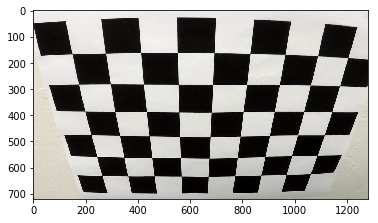

In [2]:
img = mpimg.imread('camera_cal/calibration2.jpg')
image_shape = img.shape
print(image_shape)
plt.imshow(img)

### Calibration

In the checkerboard, there are 9 corners in a row and 6 corners in a column so nx=9 and ny=9. By using glob I can iterate over all the images in the calibration folder. 

In [3]:
def calibrate_camera():

    # Read in and make a list of calibration images
    images = glob.glob('camera_cal/calibration*.jpg')

    # Nx is number of corners in row of checkerboard and ny is number of corners
    # in column of chessboard
    nx = 9
    ny = 6

    # Arrays to store object points and image points from all the images
    objpoints = [] # 3D points in real world space
    imgpoints = [] # 2D points in image plane

    # Prepare object points like (0,0,0), (1,0,0), (2,0,0) ....(7,5,0)
    objp = np.zeros((nx*ny,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2) # x, y coordinates

    for fname in images:

        img = mpimg.imread(fname)

        # Convert image to grayscale
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

        #Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

        #If corners are found, add object points, image points
        if ret == True:
            imgpoints.append(corners)
            objpoints.append(objp)

            # draw and display the corners
            img = cv2.drawChessboardCorners(img,(nx,ny), corners, ret)
            plt.imshow(img)

    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

    return mtx, dist

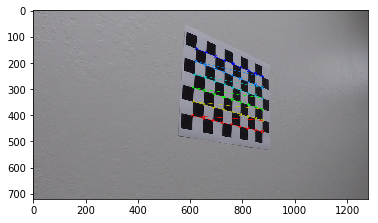

In [4]:
cam_mtx, cam_dist = calibrate_camera()

### Distortion Correction Examples

By using the cameraMatrix and distortionCoeffs values, we are able to undistort the image. Below are given examples for the chessboard images and the actual test images before and after distortion correction.

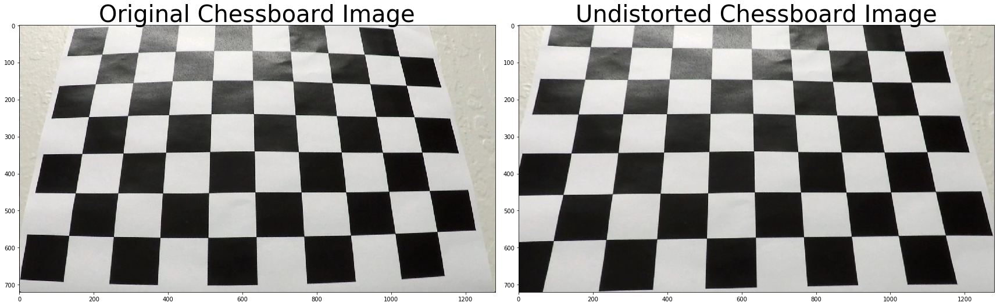

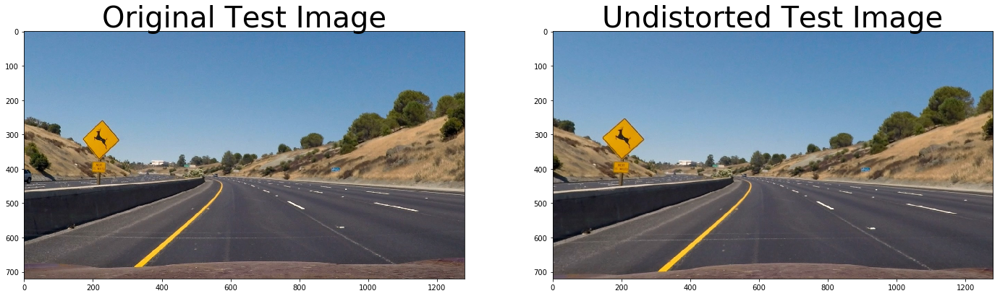

In [5]:
# Undistort and plot chessboard image
img1 = mpimg.imread('camera_cal/calibration3.jpg')
undistorted_chess = cv2.undistort(img1, cam_mtx, cam_dist, None, cam_mtx)
x, (ax1, ax2) = plt.subplots(1,2, figsize=(24,9))
x.tight_layout()
ax1.imshow(img1)
ax1.set_title('Original Chessboard Image', fontsize=40)
ax2.imshow(undistorted_chess)
ax2.set_title('Undistorted Chessboard Image',fontsize=40)

# Undistort and plot test image
img2 = mpimg.imread('test_images/test2.jpg')
undistorted_test = cv2.undistort(img2, cam_mtx, cam_dist, None, cam_mtx)
y, (ax3,ax4) = plt.subplots(1,2, figsize=(24,9))
x.tight_layout()
ax3.imshow(img2)
ax3.set_title('Original Test Image', fontsize = 40)
ax4.imshow(undistorted_test)
ax4.set_title('Undistorted Test Image', fontsize = 40)

### Gradient Measurement Functions and Edge Detection:

1. Region of Interest to apply image mask
2. Absolute Sobel Threshold: X and Y
3. Magnitude of the Gradient Threshold
4. Direction of the Gradient Threshold


In [6]:
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

In [7]:
# Define a function that takes an image, gradient orientation,
# and threshold min / max values.
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0,255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    # Return the result
    return binary_output

# Define a function to return the magnitude of the gradient
# for a given sobel kernel size and threshold values
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

# Define a function to threshold an image for a given range and Sobel kernel
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

In [8]:
# Read in an image to use as examples for gradiant functions
image = mpimg.imread('test_images/test2.jpg')

Running example for absolute sobel X threshold

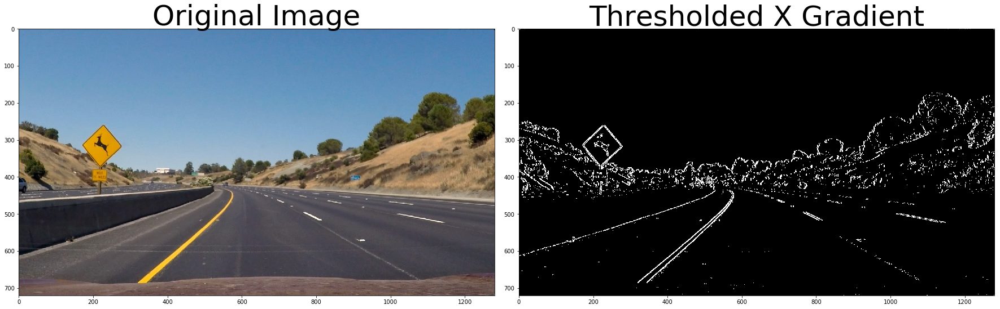

In [9]:
# Run the function
grad_binary = abs_sobel_thresh(image, orient='x', sobel_kernel=3, thresh=(30, 130))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(grad_binary, cmap='gray')
ax2.set_title('Thresholded X Gradient', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

Running example for absolute sobel Y threshold

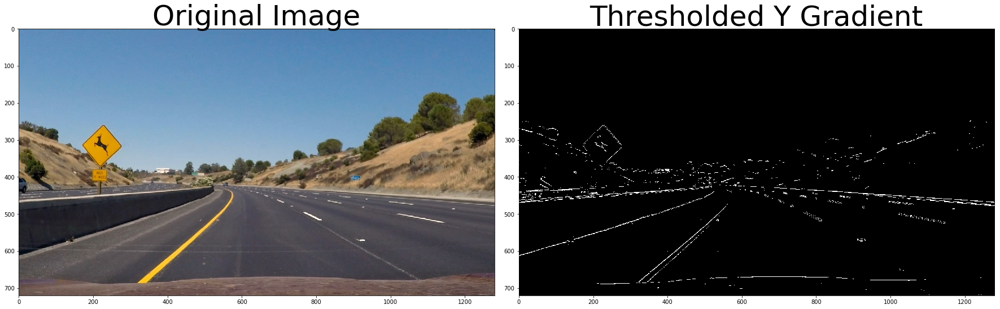

In [10]:
# Run the function
grad_binary = abs_sobel_thresh(image, orient='y', sobel_kernel=3, thresh=(70, 130))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(grad_binary, cmap='gray')
ax2.set_title('Thresholded Y Gradient', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

Running example for magnitue of the gradient

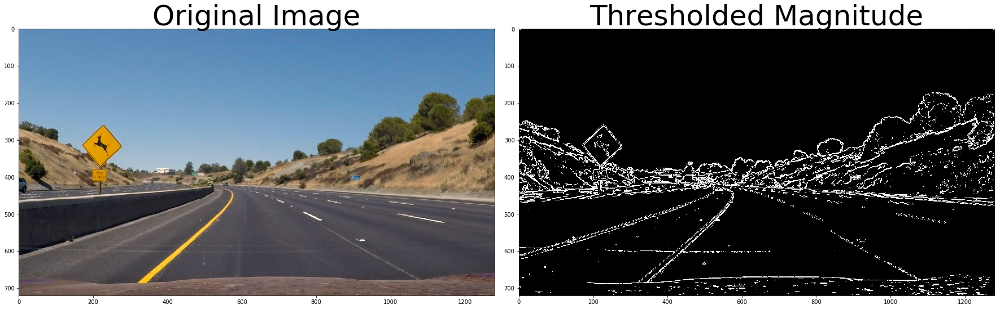

In [11]:
# Run the function
mag_binary = mag_thresh(image, sobel_kernel=3, mag_thresh=(30, 100))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Thresholded Magnitude', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

Running example for direction of the gradient

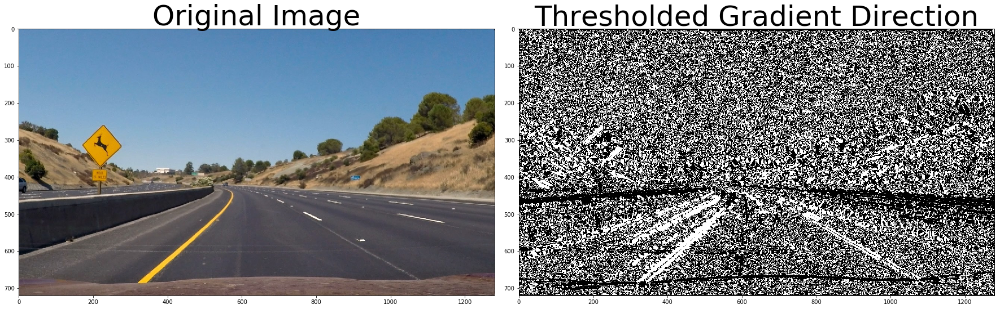

In [12]:
# Run the function
dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.7, 1.3))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(dir_binary, cmap='gray')
ax2.set_title('Thresholded Gradient Direction', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#### Creating Combination of Each of the Thresholding Functions

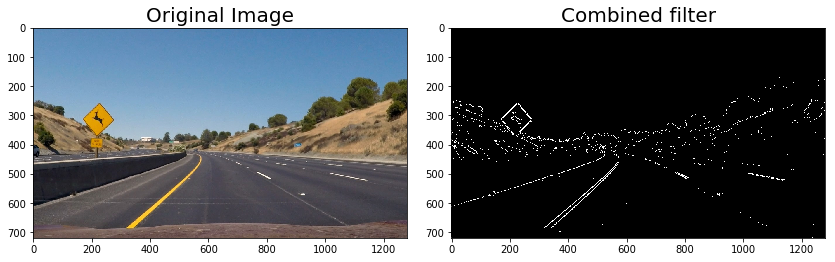

In [13]:
# Choose a Sobel kernel size
ksize = 3 # Choose a larger odd number to smooth gradient measurements

# Apply each of the thresholding functions
gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=(30, 230))
grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh=(30, 230))
mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(80, 150))
dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(.7, 1.3))

combined = np.zeros_like(dir_binary)
combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1



# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 5))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(combined, cmap='gray')
ax2.set_title('Combined filter', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [14]:
def pipeline(img):
    img = cv2.undistort(img, cam_mtx, cam_dist, None, cam_mtx)
     
        
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    height, width = gray.shape
    
    # Sobel Kernel size
    kernel=3
    
    # Using combination of thresholding functions
    gradx = abs_sobel_thresh(img, orient='x', sobel_kernel=kernel, thresh=(10,200))
    dir_binary = dir_threshold(img, sobel_kernel=kernel, thresh=(np.pi/6,np.pi/2))
    combined = ((gradx == 1) & (dir_binary == 1))
    
    # Color channel threshold
    color_threshold = 150
    R = img[:,:,0]
    G = img[:,:,1]
    combined_color = np.zeros_like(R)
    r_g_condition = (R > color_threshold) & (G > color_threshold)
    
    # Using HLS color space while seperating the s channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    S=hls[:,:,2]
    L=hls[:,:,1]
    
    s_threshold=(100,255)
    s_condition = (S>s_threshold[0]) & (S<s_threshold[1])
    
    l_threshold = (120, 255)
    l_condition = (L>l_threshold[0]) & (L<=l_threshold[1])
    
    combined_color[(r_g_condition & l_condition) & (s_condition | combined)] = 1
    
    # Mask area
    mask = np.zeros_like(combined_color)
    vertices = np.array([[0,height-1], [width/2, int(0.5*height)], [width-1, height-1]], dtype=np.int32)
    cv2.fillPoly(mask, [vertices], 1)
    color_binary = cv2.bitwise_and(combined_color, mask)
    return color_binary


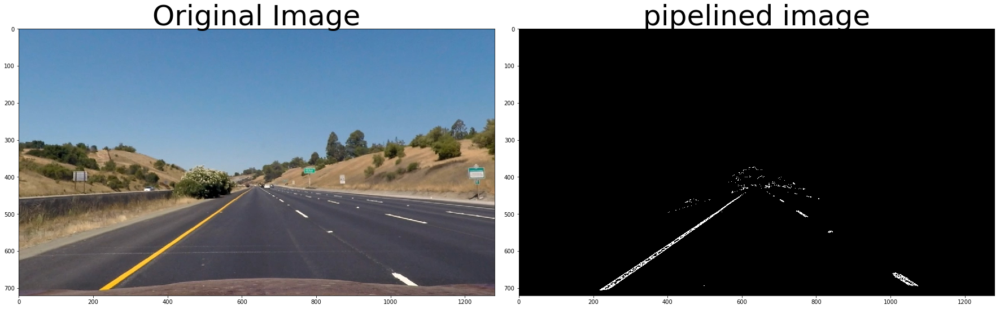

In [15]:
img = mpimg.imread('test_images/straight_lines1.jpg')
pipelined_image = pipeline(img)
img = cv2.undistort(img, cam_mtx, cam_dist, None, cam_mtx)
cv2.imwrite('pipelined image.jpg',pipelined_image)

# Plot the 2 images side by side
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(pipelined_image, cmap='gray')
ax2.set_title('pipelined image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

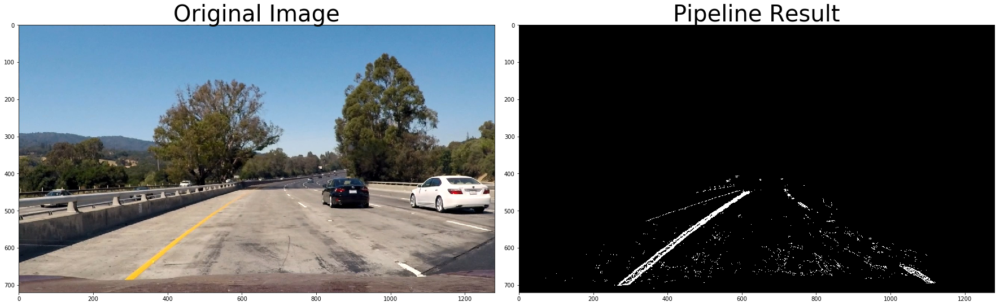

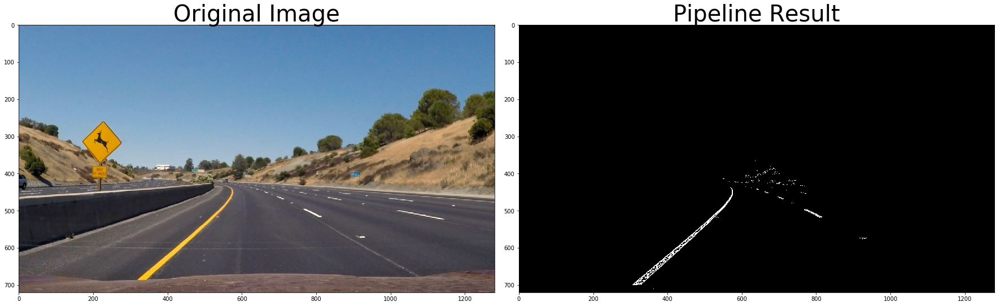

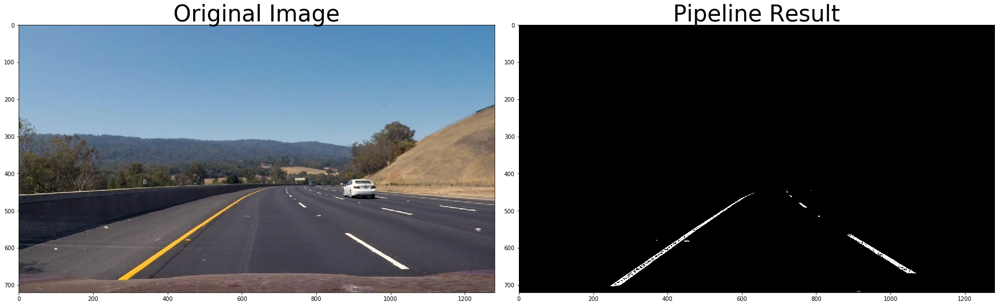

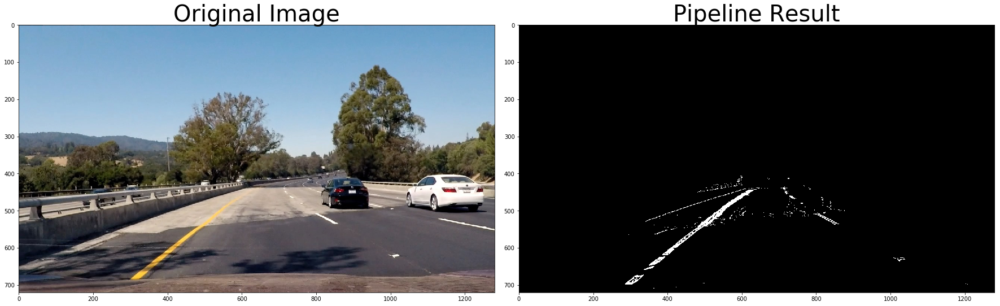

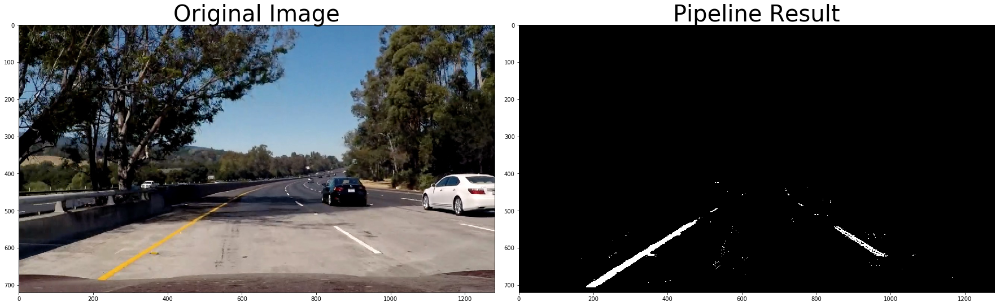

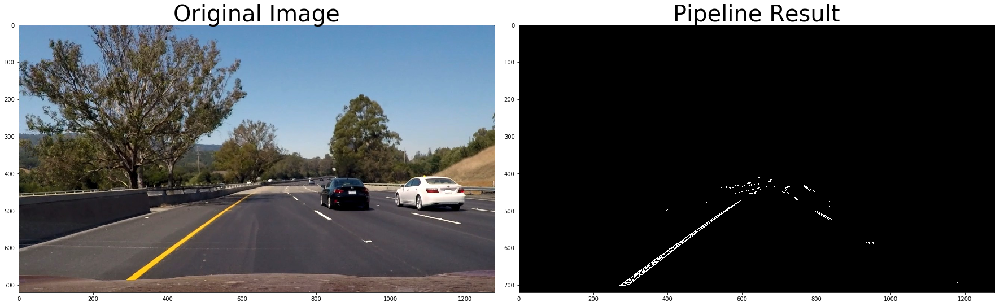

In [16]:
test_images = glob.glob('test_images/test*.jpg')
    
for fname in test_images:

    img2 = mpimg.imread(fname)
    result = pipeline(img2)
    
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(img2)
    ax1.set_title('Original Image', fontsize=40)

    ax2.imshow(result, cmap='gray')
    ax2.set_title('Pipeline Result', fontsize=40)
   
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Perspective Transform

(Birds Eye View)

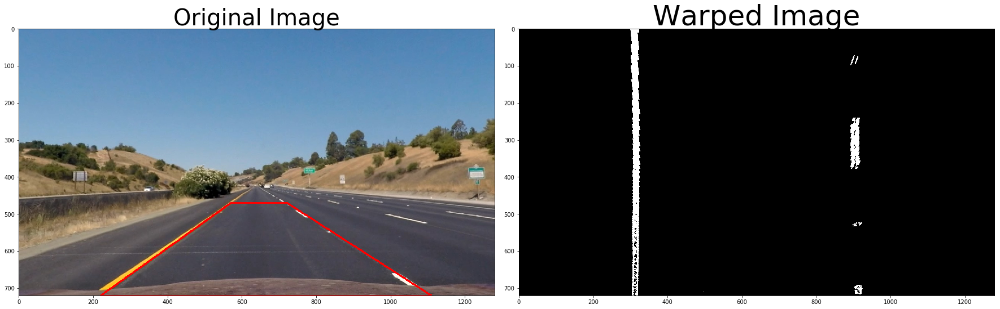

In [17]:
source = np.float32(
        [[220,720],
         [1110,720],
         [722,470],
         [570,470]])

pts = np.array(
        [[220,720],
         [1110,720],
         [722,470],
         [570,470]], np.int32)
pts = pts.reshape((-1,1,2))
copy = img.copy()
cv2.polylines(copy,[pts],True,(255,0,0), thickness=3)

dst = np.float32(
        [[320,720],
         [920,720],
         [920,1],
         [320,1]])

M = cv2.getPerspectiveTransform(source, dst)
M_inv = cv2.getPerspectiveTransform(dst, source)
img_size = (image_shape[1], image_shape[0])

first = pipeline(img)
binary_warped = cv2.warpPerspective(first, M, img_size , flags=cv2.INTER_LINEAR)


# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(copy)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(binary_warped, cmap='gray')
ax2.set_title('Warped Image', fontsize=50)
   
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)




### Line Finding Method: Peaks in a Histogram

Once I applied calibration, thresholding, and a perspective transform, I am given a binary image where the lane lines stand out. I need to then decide which pixels are part of left line and which pixels are part of the right. A histogram peaks will show this. 

The two most prominent peaks in this histogram will determine those lines and will be a good starting point to find the next lines in the following frames. 

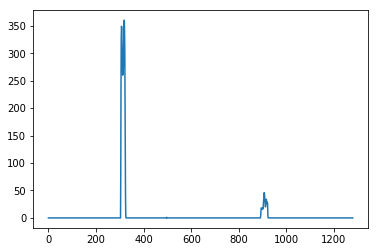

In [18]:
# Assuming you have created a warped binary image called "binary_warped"
# Take a histogram of the bottom half of the image
histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
plt.plot(histogram)

#### Implement Sliding Windows and Fiting a Polynomial

In [19]:
# Create an output image to draw on and  visualize the result
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
# Find the peak of the left and right halves of the histogram
# These will be the starting point for the left and right lines
midpoint = np.int(histogram.shape[0]/2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint

# Choose the number of sliding windows
nwindows = 9
num_rows = binary_warped.shape[0]
# Set height of windows
window_height = np.int(binary_warped.shape[0]/nwindows)
# Identify the x and y positions of all nonzero pixels in the image
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
# Current positions to be updated for each window
leftx_current = leftx_base
rightx_current = rightx_base
# Set the width of the windows +/- margin
margin = 100
# Set minimum number of pixels found to recenter window
minpix = 50
# Create empty lists to receive left and right lane pixel indices
left_lane_inds = []
right_lane_inds = []

# Step through the windows one by one
for window in range(nwindows):
    # Identify window boundaries in x and y (and right and left)
    win_y_low = binary_warped.shape[0] - (window+1)*window_height
    win_y_high = binary_warped.shape[0] - window*window_height
    win_xleft_low = leftx_current - margin
    win_xleft_high = leftx_current + margin
    win_xright_low = rightx_current - margin
    win_xright_high = rightx_current + margin
    # Draw the windows on the visualization image
    cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
    (0,255,0), 2) 
    cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
    (0,255,0), 2) 
    # Identify the nonzero pixels in x and y within the window
    good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
    (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
    good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
    (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
    # Append these indices to the lists
    left_lane_inds.append(good_left_inds)
    right_lane_inds.append(good_right_inds)
    # If you found > minpix pixels, recenter next window on their mean position
    if len(good_left_inds) > minpix:
        leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
    if len(good_right_inds) > minpix:        
        rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

# Concatenate the arrays of indices
left_lane_inds = np.concatenate(left_lane_inds)
right_lane_inds = np.concatenate(right_lane_inds)

# Extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds] 

# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)

#### Visualization 

(720, 0)

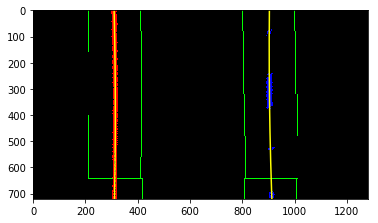

In [20]:
# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

#### Skip the sliding windows step once you know where the lines are

In [21]:
# Assume you now have a new warped binary image 
# from the next frame of video (also called "binary_warped")
# It's now much easier to find line pixels!
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
margin = 100
left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
left_fit[1]*nonzeroy + left_fit[2] + margin))) 

right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
right_fit[1]*nonzeroy + right_fit[2] + margin)))  

# Again, extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds]
# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)
# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

#### Visualization

(720, 0)

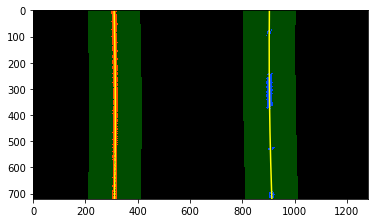

In [22]:
# Create an image to draw on and an image to show the selection window
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
window_img = np.zeros_like(out_img)
# Color in left and right line pixels
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

# Generate a polygon to illustrate the search window area
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.imshow(result)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

In [23]:
def radius_of_curvature(x_values):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    ploty = np.linspace(0, num_rows-1, num_rows)
    y_eval = np.max(ploty)


    # Fit new polynomials to x,y in world space
    fit_cr = np.polyfit(ploty*ym_per_pix, x_values*xm_per_pix, 2)
    curverad = ((1 + (2*fit_cr[0]*y_eval*ym_per_pix + fit_cr[1])**2)**1.5) / np.absolute(2*fit_cr[0])
    return curverad

left = radius_of_curvature(left_fitx)
right = radius_of_curvature(right_fitx)
average = (left+right)/2
curvature = "Radius of Curvature: %.2f m" % average
print(curvature)

center = (right_fitx[719]+left_fitx[719])/2
meters_per_pixel = 3.7/700
pixels_center_offset = abs(img_size[0]/2 - center)
mtrs_center_offset = meters_per_pixel*pixels_center_offset
offset = "Center Offset: %.2f m" % mtrs_center_offset
print(offset)

Radius of Curvature: 5246.48 m
Center Offset: 0.15 m


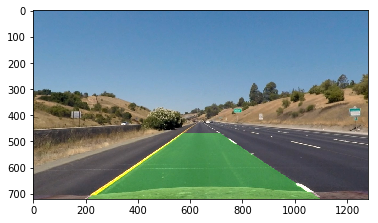

In [24]:
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
ploty = np.linspace(0, num_rows-1, num_rows)
left_line = np.array(np.transpose(np.vstack([left_fitx, ploty])))
right_line = np.array(np.flipud(np.transpose(np.vstack([right_fitx, ploty]))))
points_of_line = np.vstack((left_line, right_line))
cv2.fillPoly(out_img, np.int_([points_of_line]), [0,255, 0])
unwarped = cv2.warpPerspective(out_img, M_inv, img_size , flags=cv2.INTER_LINEAR)
result = cv2.addWeighted(img, 1, unwarped, 0.3, 0)
plt.imshow(result)

## Finalizing Useful Functions and Creating Final Pipeline

#### function line_predictions uses nonzero pixels and coordinates from sliding window to predicit the next lane line

In [25]:
left_polyfit = None
right_polyfit = None

left_lines_before = []
right_lines_before = []

rmd_bt_lines = 0

def line_predictions(x_non_zeros , y_non_zeros, coordinates_left, coordinates_right, rows_num):
    x_left = x_non_zeros[coordinates_left]
    y_left = y_non_zeros[coordinates_left]
    
    # Conditional of no pixels were found
    if(x_left.size == 0 or y_left.size == 0):
        return None, None
    
    left_polyfit=np.polyfit(y_left, x_left, 2)
    
    x_right = x_non_zeros[coordinates_right]
    y_right = y_non_zeros[coordinates_right]
    
    # Conditional if no pixels were found
    if(x_right.size == 0 or y_right.size == 0):
        return None, None
    
    right_polyfit=np.polyfit(y_right, x_right, 2)
    
    ploty = np.linspace(0, rows_num-1, rows_num)
    
    # Generate lane lines from polynomial fit
    predictions_rightx = right_polyfit[0]*ploty**2 + right_polyfit[1]*ploty + right_polyfit[2]
    predictions_leftx = left_polyfit[0]*ploty**2 + left_polyfit[1]*ploty + left_polyfit[2]
    
    return predictions_leftx, predictions_rightx
    

#### Function search_forced is used when thresholding and sliding window search is needed again because new lines from next frame cannot be found. Basically a reset for the next frame image when polynomial fit is not working and generates a new prediction for the lane lines.

In [26]:
def search_forced(binary_warped):
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)

    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    # Choose the number of sliding windows
    nwindows = 9
    num_rows = binary_warped.shape[0]
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
        # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
         # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    
    predictions_leftx, predictions_rightx = line_predictions(nonzerox, nonzeroy, left_lane_inds, right_lane_inds, num_rows)
    
    return predictions_leftx, predictions_rightx


#### By taking previous good frames, average_line function calculates the average lane line

In [27]:
def average_line(lines_before, new_line):
    frames=12
    
    if new_line is None:
        if(len(lines_before) == 0):
            return lines_before, None
        else:
            return lines_before, lines_before[-1]
    else:
        if len(lines_before)<frames:
            lines_before.append(new_line)
            return lines_before, new_line
        else:
            lines_before[0:frames-1] = lines_before[1:]
            lines_before[frames-1] = new_line
            new_line = np.zeros_like(new_line)
            for a in range (frames):
                new_line += lines_before[a]
            new_line /= frames
            return lines_before, new_line

#### lines_mean_distance simply returns average of difference between the left and right lines

In [28]:
def lines_mean_distance(line_left, line_right, running_average):
    mean = np.mean(line_right-line_left)
    if running_average == 0:
        running_average = mean_distance
    else:
        running_average = 0.9*running_average+0.1*mean
    return running_average

## Final Pipeline



In [29]:
def final_pipeline(img):
    # global variables
    
    # polynomial coefficients from last fram of line detected
    global left_polyfit
    global right_polyfit
    
    # line coordinates from previous frames
    global left_lines_before
    global right_lines_before

    # running average of mean difference between the right and left lanes
    global rmd_bt_lines
    
    shape_img = img.shape
    size_img = (shape_img[1], shape_img[0])
    
    # getting thresholded image from first pipeline
    first = pipeline(img)
    
    # perspective transform
    binary_warped = cv2.warpPerspective(first, M, img_size , flags=cv2.INTER_LINEAR)
    
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    num_rows = binary_warped.shape[0]
    ploty = np.linspace(0, num_rows-1, num_rows)

    if(left_polyfit is None) or (right_polyfit is None):
        forced = True
        predictions_leftx, predictions_rightx = search_forced(binary_warped)
    else: 
        forced = False
        margin = 100
        
        predictions_leftx = left_polyfit[0]*nonzeroy**2 + left_polyfit[1]*nonzeroy + left_polyfit[2]
        coordinates_left = ((nonzerox >= predictions_leftx - margin) & (nonzerox <= predictions_leftx + margin)).nonzero()[0]
        
        predictions_rightx = right_polyfit[0]*nonzeroy**2 + right_polyfit[1]*nonzeroy + right_polyfit[2]
        coordinates_right = ((nonzerox >= predictions_rightx - margin) & (nonzerox <= predictions_rightx + margin)).nonzero()[0]
        
        predictions_leftx, predictions_rightx = line_predictions(nonzerox, nonzeroy, coordinates_left, coordinates_right, num_rows)
        
    if(predictions_leftx is None or predictions_rightx is None):
        if not forced:
            predictions_leftx, predictions_rightx = search_forced(binary_warped)
        
    lines_bad = False
        
    if (predictions_leftx is None or predictions_rightx is None):
        lines_bad = True
    else:
        difference_mean = np.mean(predictions_rightx - predictions_leftx)
        
        if rmd_bt_lines == 0:
            rmd_bt_lines = difference_mean
        
        if (difference_mean < 0.7*rmd_bt_lines or difference_mean > 1.3*rmd_bt_lines):
            lines_bad = True
            if not forced:
                predictions_leftx, predictions_rightx = search_forced(binary_warped)
                if (predictions_leftx is None or predictions_rightx is None):
                    lines_bad = True
                else:
                    difference_mean = np.mean(predictions_rightx - predictions_leftx)
                    if (difference_mean < 0.7*rmd_bt_lines or difference_mean > 1.3*rmd_bt_lines):
                            lines_bad = True
                    else:
                        lines_bad = False
        else:
            lines_bad = False
        
    if lines_bad:
        left_polyfit = None
        right_polyfit = None
        if len(left_lines_before) == 0 and len(right_lines_before) == 0:
            return img
        else:
            predictions_leftx = left_lines_before[-1]
            predictions_rightx = right_lines_before[-1]
    else:
        left_lines_before, predictions_leftx = average_line(left_lines_before, predictions_leftx)
        right_lines_before, predictions_rightx = average_line(right_lines_before, predictions_rightx)
        difference_mean = np.mean(predictions_rightx - predictions_leftx)
        rmd_bt_lines = 0.9*rmd_bt_lines + 0.1*difference_mean
        
    window_left_line = np.array(np.transpose(np.vstack([predictions_leftx, ploty])))
    window_right_line = np.array(np.flipud(np.transpose(np.vstack([predictions_rightx, ploty]))))
    
    # radius of curvature to be printed
    curve_left_rad = radius_of_curvature(predictions_leftx)
    curve_right_rad = radius_of_curvature(predictions_rightx)
    curve_rad_average = (curve_left_rad + curve_right_rad)/2
    string_curve = "Curvature Radius: %.2f m" % curve_rad_average
    
    # offset from center to be printed
    center = (predictions_rightx[num_rows -1]+predictions_leftx[num_rows-1])/2
    meters_per_pixel = 3.7/700
    pixels_center_offset = abs(size_img[0]/2 - center)
    mtrs_center_offset = meters_per_pixel*pixels_center_offset
    offset = "Center Offset: %.2f m" % mtrs_center_offset

    points_poly = np.vstack([window_left_line, window_right_line])
    cv2.fillPoly(out_img, np.int_([points_poly]), [0,255,0])
    unwarped = cv2.warpPerspective(out_img, M_inv, img_size, flags = cv2.INTER_LINEAR)
    answer = cv2.addWeighted(img, 1, unwarped, 0.3, 0)
    cv2.putText(answer, string_curve, (100, 90), cv2.FONT_HERSHEY_DUPLEX, 1.5, (255,255,255), thickness = 2)
    cv2.putText(answer, offset, (100, 150), cv2.FONT_HERSHEY_DUPLEX, 1.5, (255,255,255), thickness = 2)
    return answer
        
         

### Example Image from applying final pipeline

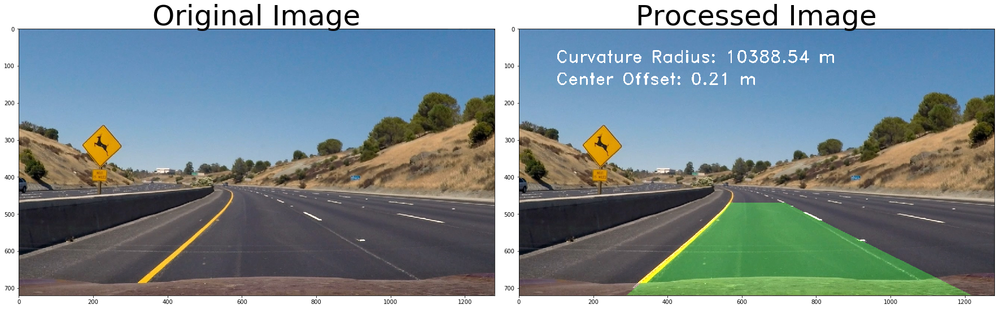

In [30]:
img = mpimg.imread('test_images/test2.jpg')

# Must reintialize the global variables from final pipeline
left_polyfit = None
right_polyfit = None
    
left_lines_before = []
right_lines_before = []

rmd_bt_lines = 0

#Applying final pipeline
processed = final_pipeline(img)

# Plot the 2 images, original and final processed image
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(processed, cmap='gray')
ax2.set_title('Processed Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Video Pipeline for Project Video. 

We use moviepy.

In [31]:
from moviepy.editor import VideoFileClip

left_polyfit = None
right_polyfit = None
    
left_lines_before = []
right_lines_before = []

rmd_bt_lines = 0

output = 'project_video_output.mp4'
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(final_pipeline) #NOTE: this function expects color images!!
%time white_clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████████████████████████████████████████████████████▉| 1260/1261 [04:17<00:00,  5.07it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

Wall time: 4min 18s


<video controls src="project_video_output.mp4" / | width = 750>

## Challenge Video

In [32]:
left_polyfit = None
right_polyfit = None
    
left_lines_before = []
right_lines_before = []

rmd_bt_lines = 0

output2 = 'challenge_video_output.mp4'
challenge_clip = VideoFileClip("challenge_video.mp4")
pipe_clip2 = challenge_clip.fl_image(final_pipeline) #NOTE: this function expects color images!!
%time pipe_clip2.write_videofile(output2, audio=False)

[MoviePy] >>>> Building video challenge_video_output.mp4
[MoviePy] Writing video challenge_video_output.mp4


100%|████████████████████████████████████████████████████████████| 485/485 [01:40<00:00,  4.77it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_output.mp4 

Wall time: 1min 41s


<video controls src="challenge_video_output.mp4" / | width = 750>